# EDA: YOLOv8 Person Detection & InsightFace Face Analysis

This notebook explores:
1. **YOLOv8-Pose** - Person detection with keypoints and body orientation
2. **InsightFace** - Face detection with landmarks, age, gender, and attributes
3. **Combined Analysis** - Person + Face detection together

**Dataset**: `D:\Budapest2025_Google`

In [1]:
# Imports and Setup
import sys
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image, ImageOps, ImageDraw
from typing import List, Dict, Any, Optional, Tuple
import warnings
warnings.filterwarnings('ignore')

# Add project root to path
PROJECT_ROOT = Path(r"D:\sim-bench")
sys.path.insert(0, str(PROJECT_ROOT))

# Dataset path
DATASET_PATH = Path(r"D:\Budapest2025_Google")

# Get all images
IMAGE_EXTENSIONS = {'.jpg', '.jpeg', '.png', '.webp', '.bmp'}
all_images = sorted([
    p for p in DATASET_PATH.rglob('*') 
    if p.suffix.lower() in IMAGE_EXTENSIONS
])
print(f"Found {len(all_images)} images in {DATASET_PATH}")

Found 122 images in D:\Budapest2025_Google


In [2]:
# Helper functions for visualization

def load_image(path: Path) -> Image.Image:
    """Load image with EXIF rotation correction."""
    img = Image.open(path)
    img = ImageOps.exif_transpose(img)
    return img.convert('RGB')

def draw_bbox(ax, bbox_dict: Dict, color='red', linewidth=2, label=None):
    """Draw bounding box on matplotlib axes."""
    x, y, w, h = bbox_dict['x_px'], bbox_dict['y_px'], bbox_dict['w_px'], bbox_dict['h_px']
    rect = patches.Rectangle((x, y), w, h, linewidth=linewidth, edgecolor=color, facecolor='none')
    ax.add_patch(rect)
    if label:
        ax.text(x, y-5, label, color=color, fontsize=8, fontweight='bold',
                bbox=dict(boxstyle='round,pad=0.2', facecolor='white', alpha=0.7))

def draw_keypoints(ax, keypoints: np.ndarray, img_w: int, img_h: int, threshold=0.3):
    """Draw COCO keypoints on matplotlib axes."""
    # COCO keypoint names
    kp_names = ['nose', 'left_eye', 'right_eye', 'left_ear', 'right_ear',
                'left_shoulder', 'right_shoulder', 'left_elbow', 'right_elbow',
                'left_wrist', 'right_wrist', 'left_hip', 'right_hip',
                'left_knee', 'right_knee', 'left_ankle', 'right_ankle']
    
    # Skeleton connections
    skeleton = [
        (0, 1), (0, 2), (1, 3), (2, 4),  # Head
        (5, 6), (5, 7), (7, 9), (6, 8), (8, 10),  # Arms
        (5, 11), (6, 12), (11, 12),  # Torso
        (11, 13), (13, 15), (12, 14), (14, 16)  # Legs
    ]
    
    # Draw skeleton lines
    for i, j in skeleton:
        if keypoints[i, 2] > threshold and keypoints[j, 2] > threshold:
            x1, y1 = keypoints[i, 0] * img_w, keypoints[i, 1] * img_h
            x2, y2 = keypoints[j, 0] * img_w, keypoints[j, 1] * img_h
            ax.plot([x1, x2], [y1, y2], 'g-', linewidth=2, alpha=0.7)
    
    # Draw keypoints
    for idx, (x, y, conf) in enumerate(keypoints):
        if conf > threshold:
            px, py = x * img_w, y * img_h
            color = 'lime' if conf > 0.5 else 'yellow'
            ax.plot(px, py, 'o', markersize=6, color=color, markeredgecolor='black')

def show_images_grid(images_data: List[Dict], title: str, cols=5):
    """Show images in a grid with annotations."""
    n = len(images_data)
    rows = (n + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(4*cols, 4*rows))
    if rows == 1:
        axes = [axes] if cols == 1 else axes
    axes = np.array(axes).flatten()
    
    for idx, ax in enumerate(axes):
        if idx < n:
            data = images_data[idx]
            img = load_image(data['path'])
            ax.imshow(img)
            ax.set_title(f"{data['path'].name}\n{data.get('info', '')}", fontsize=8)
            
            # Draw bboxes if present
            if 'person_bbox' in data and data['person_bbox']:
                draw_bbox(ax, data['person_bbox'], color='red', label='Person')
            if 'face_bbox' in data and data['face_bbox']:
                draw_bbox(ax, data['face_bbox'], color='blue', label='Face')
            
            # Draw keypoints if present
            if 'keypoints' in data and data['keypoints'] is not None:
                draw_keypoints(ax, data['keypoints'], img.width, img.height)
        ax.axis('off')
    
    plt.suptitle(title, fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.show()

---
# Part 1: YOLOv8 Person Detection

YOLOv8-Pose provides:
- **Bounding boxes** for detected persons
- **Confidence scores** (0-1)
- **17 COCO keypoints** (pose skeleton)
- **Body facing score** (computed from shoulder/hip symmetry)

In [3]:
# Load YOLOv8-Pose model
from ultralytics import YOLO

# Model sizes: 'n' (nano), 's' (small), 'm' (medium), 'l' (large), 'x' (xlarge)
MODEL_SIZE = 's'  # Change this to experiment with different model sizes
yolo_model = YOLO(f'yolov8{MODEL_SIZE}-pose.pt')
print(f"Loaded YOLOv8{MODEL_SIZE}-pose model")

Loaded YOLOv8s-pose model


In [4]:
def detect_person_yolo(image_path: Path, model, conf_threshold=0.25) -> Dict[str, Any]:
    """Detect persons in image using YOLOv8-Pose.
    
    Returns dict with:
    - person_detected: bool
    - detections: list of detection dicts
    - primary_detection: the largest person (if any)
    """
    img = load_image(image_path)
    img_w, img_h = img.size
    
    # Run inference
    results = model(img, conf=conf_threshold, verbose=False)
    
    detections = []
    for result in results:
        if result.keypoints is None:
            continue
            
        boxes = result.boxes
        keypoints_data = result.keypoints
        
        for i in range(len(boxes)):
            # Only process person class (class 0)
            if int(boxes.cls[i]) != 0:
                continue
                
            # Bounding box
            x1, y1, x2, y2 = boxes.xyxy[i].cpu().numpy()
            conf = float(boxes.conf[i])
            
            bbox = {
                'x': x1 / img_w,
                'y': y1 / img_h,
                'w': (x2 - x1) / img_w,
                'h': (y2 - y1) / img_h,
                'x_px': int(x1),
                'y_px': int(y1),
                'w_px': int(x2 - x1),
                'h_px': int(y2 - y1),
            }
            
            # Keypoints (17 COCO keypoints)
            kps = keypoints_data.xyn[i].cpu().numpy()  # Normalized (0-1)
            kps_conf = keypoints_data.conf[i].cpu().numpy() if keypoints_data.conf is not None else np.ones(17)
            keypoints = np.column_stack([kps, kps_conf])  # (17, 3): x, y, conf
            
            # Body facing score (shoulder-hip symmetry)
            body_facing_score = compute_body_facing_score(keypoints)
            
            # Average keypoint confidence
            kp_conf_mean = float(np.mean(kps_conf[kps_conf > 0])) if np.any(kps_conf > 0) else 0.0
            
            detections.append({
                'bbox': bbox,
                'confidence': conf,
                'keypoints': keypoints,
                'body_facing_score': body_facing_score,
                'keypoint_confidence': kp_conf_mean,
                'area': bbox['w'] * bbox['h'],  # For sorting
            })
    
    # Sort by area (largest first) and pick primary
    detections.sort(key=lambda x: x['area'], reverse=True)
    
    return {
        'path': image_path,
        'person_detected': len(detections) > 0,
        'num_persons': len(detections),
        'detections': detections,
        'primary': detections[0] if detections else None,
    }

def compute_body_facing_score(keypoints: np.ndarray, threshold=0.3) -> float:
    """Compute body facing score from shoulder-hip symmetry.
    
    Score near 1.0 = front-facing
    Score near 0.0 = side view
    """
    # Keypoint indices: 5=left_shoulder, 6=right_shoulder, 11=left_hip, 12=right_hip
    left_shoulder = keypoints[5]
    right_shoulder = keypoints[6]
    left_hip = keypoints[11]
    right_hip = keypoints[12]
    
    # Check if keypoints are reliable
    if (left_shoulder[2] < threshold or right_shoulder[2] < threshold or
        left_hip[2] < threshold or right_hip[2] < threshold):
        return 0.5  # Unknown
    
    # Compute widths
    shoulder_width = abs(right_shoulder[0] - left_shoulder[0])
    hip_width = abs(right_hip[0] - left_hip[0])
    
    if max(shoulder_width, hip_width) < 0.01:
        return 0.5  # Too small to determine
    
    # Symmetry score
    symmetry = min(shoulder_width, hip_width) / (max(shoulder_width, hip_width) + 1e-6)
    return float(symmetry)

In [5]:
# Run YOLOv8 on all images
print("Running YOLOv8 person detection on all images...")
yolo_results = []

for i, img_path in enumerate(all_images):
    if (i + 1) % 50 == 0:
        print(f"  Processed {i+1}/{len(all_images)}...")
    result = detect_person_yolo(img_path, yolo_model)
    yolo_results.append(result)

print(f"\nDone! Processed {len(yolo_results)} images.")

# Summary stats
with_person = [r for r in yolo_results if r['person_detected']]
without_person = [r for r in yolo_results if not r['person_detected']]
print(f"Images with person: {len(with_person)}")
print(f"Images without person: {len(without_person)}")

Running YOLOv8 person detection on all images...
  Processed 50/122...
  Processed 100/122...

Done! Processed 122 images.
Images with person: 114
Images without person: 8



=== TOP 5 HIGHEST CONFIDENCE ===
  20250822_123448.jpg: conf=0.954, body_facing=0.50
  20250822_193458.jpg: conf=0.951, body_facing=0.65
  20250822_123347.jpg: conf=0.949, body_facing=0.68
  20250822_122617.jpg: conf=0.945, body_facing=0.64
  20250822_123451.jpg: conf=0.945, body_facing=0.50


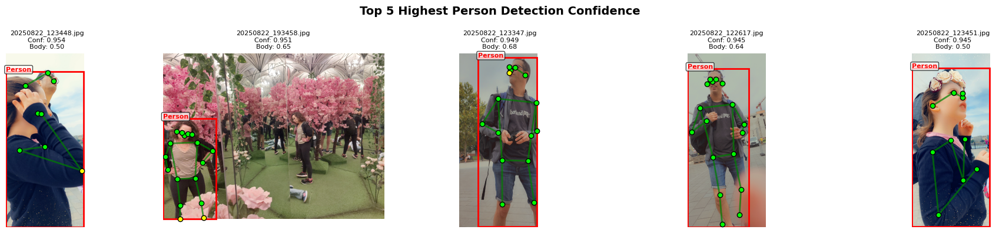

In [6]:
# Top 5 highest confidence scores
sorted_by_conf = sorted(
    [r for r in yolo_results if r['primary']],
    key=lambda x: x['primary']['confidence'],
    reverse=True
)

top5_high = sorted_by_conf[:5]
print("\n=== TOP 5 HIGHEST CONFIDENCE ===")
for r in top5_high:
    print(f"  {r['path'].name}: conf={r['primary']['confidence']:.3f}, " 
          f"body_facing={r['primary']['body_facing_score']:.2f}")

show_images_grid(
    [{
        'path': r['path'],
        'person_bbox': r['primary']['bbox'],
        'keypoints': r['primary']['keypoints'],
        'info': f"Conf: {r['primary']['confidence']:.3f}\nBody: {r['primary']['body_facing_score']:.2f}"
    } for r in top5_high],
    "Top 5 Highest Person Detection Confidence"
)


=== TOP 5 LOWEST CONFIDENCE (still detected) ===
  20250822_195016.jpg: conf=0.501, body_facing=0.62
  20250822_195124.jpg: conf=0.386, body_facing=0.50
  20250822_195121.jpg: conf=0.335, body_facing=0.50
  20250822_195021.jpg: conf=0.308, body_facing=0.50
  20250822_193734.jpg: conf=0.299, body_facing=0.50


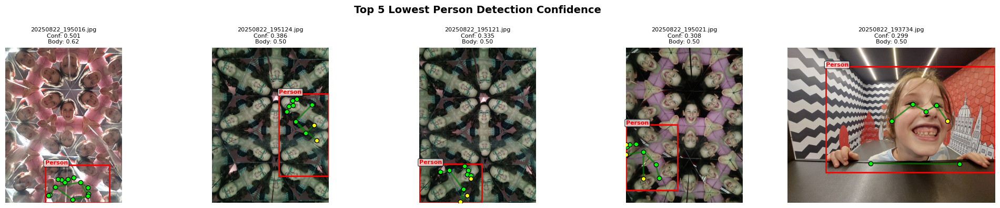

In [7]:
# Top 5 lowest confidence scores (still detected)
top5_low = sorted_by_conf[-5:]
print("\n=== TOP 5 LOWEST CONFIDENCE (still detected) ===")
for r in top5_low:
    print(f"  {r['path'].name}: conf={r['primary']['confidence']:.3f}, "
          f"body_facing={r['primary']['body_facing_score']:.2f}")

show_images_grid(
    [{
        'path': r['path'],
        'person_bbox': r['primary']['bbox'],
        'keypoints': r['primary']['keypoints'],
        'info': f"Conf: {r['primary']['confidence']:.3f}\nBody: {r['primary']['body_facing_score']:.2f}"
    } for r in top5_low],
    "Top 5 Lowest Person Detection Confidence"
)


=== IMAGES WITH NO PERSON DETECTED (8 total) ===


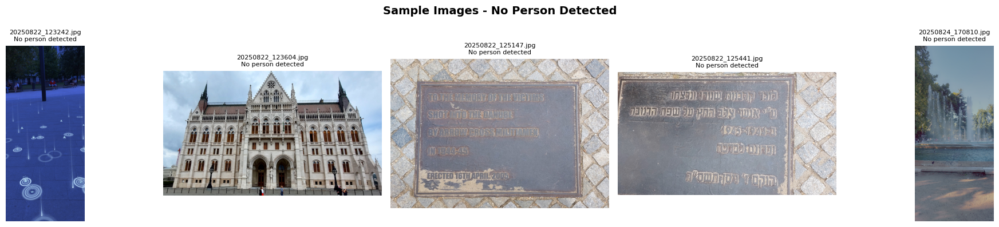

In [8]:
# Images with NO person detected
print(f"\n=== IMAGES WITH NO PERSON DETECTED ({len(without_person)} total) ===")
sample_no_person = without_person[:5] if len(without_person) >= 5 else without_person

show_images_grid(
    [{'path': r['path'], 'info': 'No person detected'} for r in sample_no_person],
    "Sample Images - No Person Detected"
)


=== TOP 5 FRONT-FACING (highest body_facing_score) ===


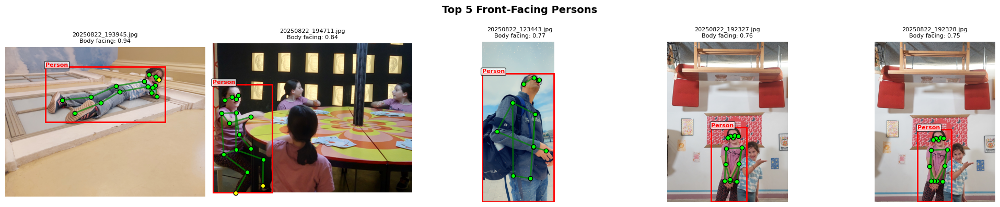


=== TOP 5 SIDE-FACING (lowest body_facing_score) ===


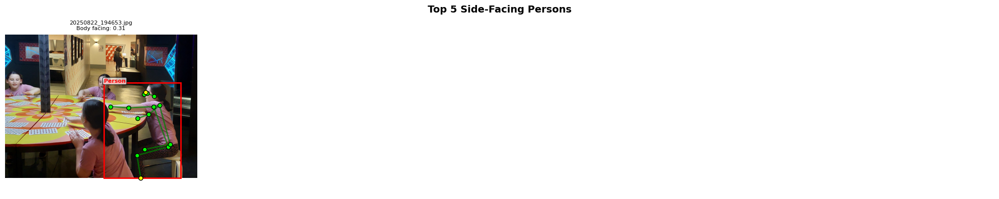

In [9]:
# Body facing score analysis
front_facing = sorted(
    [r for r in yolo_results if r['primary'] and r['primary']['body_facing_score'] > 0.6],
    key=lambda x: x['primary']['body_facing_score'],
    reverse=True
)[:5]

side_facing = sorted(
    [r for r in yolo_results if r['primary'] and r['primary']['body_facing_score'] < 0.4],
    key=lambda x: x['primary']['body_facing_score']
)[:5]

print("\n=== TOP 5 FRONT-FACING (highest body_facing_score) ===")
show_images_grid(
    [{
        'path': r['path'],
        'person_bbox': r['primary']['bbox'],
        'keypoints': r['primary']['keypoints'],
        'info': f"Body facing: {r['primary']['body_facing_score']:.2f}"
    } for r in front_facing],
    "Top 5 Front-Facing Persons"
)

print("\n=== TOP 5 SIDE-FACING (lowest body_facing_score) ===")
show_images_grid(
    [{
        'path': r['path'],
        'person_bbox': r['primary']['bbox'],
        'keypoints': r['primary']['keypoints'],
        'info': f"Body facing: {r['primary']['body_facing_score']:.2f}"
    } for r in side_facing],
    "Top 5 Side-Facing Persons"
)


=== YOLO ANALYSIS: 20250822_112331.jpg ===
Person detected: True
Number of persons: 13

Primary person:
  Confidence: 0.913
  Bounding box: x=1265, y=509, w=1411, h=4073
  Body facing score: 0.639
  Keypoint confidence (avg): 0.971

  Keypoints (17 COCO):
    nose           : (0.578, 0.258) conf=1.00
    left_eye       : (0.615, 0.230) conf=0.98
    right_eye      : (0.540, 0.231) conf=0.98
    left_ear       : (0.658, 0.239) conf=0.77
    right_ear      : (0.487, 0.242) conf=0.86
    left_shoulder  : (0.675, 0.371) conf=1.00
    right_shoulder : (0.460, 0.365) conf=1.00
    left_elbow     : (0.722, 0.492) conf=0.99
    right_elbow    : (0.412, 0.478) conf=0.99
    left_wrist     : (0.734, 0.496) conf=0.98
    right_wrist    : (0.411, 0.507) conf=0.98
    left_hip       : (0.630, 0.647) conf=1.00
    right_hip      : (0.492, 0.644) conf=1.00
    left_knee      : (0.639, 0.785) conf=1.00
    right_knee     : (0.481, 0.784) conf=1.00
    left_ankle     : (0.634, 0.887) conf=0.99
    rig

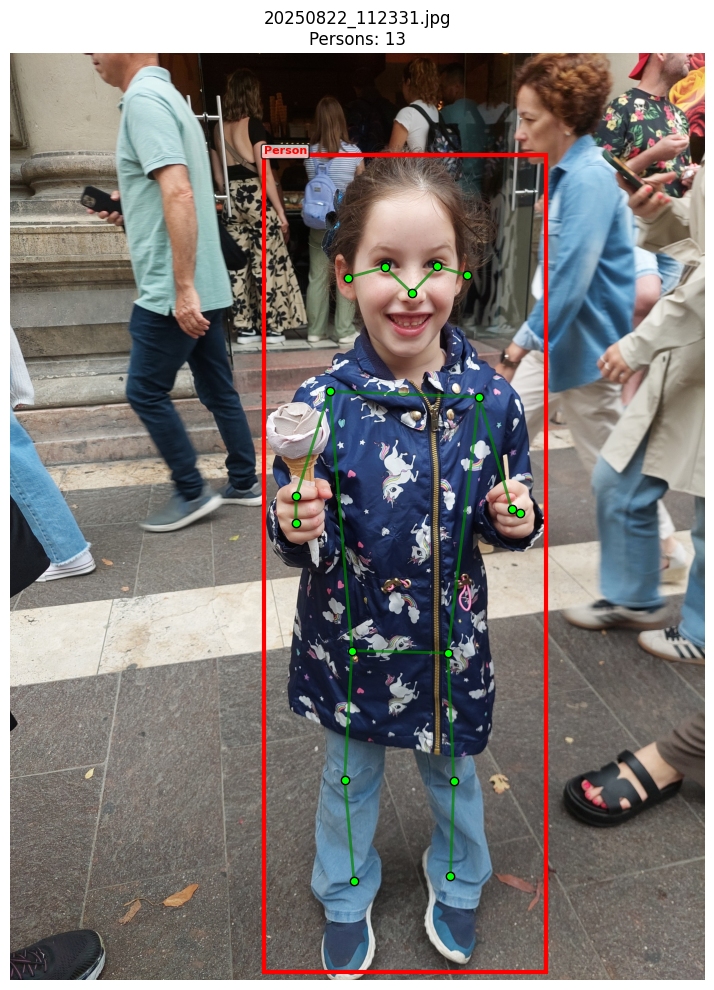

In [10]:
# === RUN ON SPECIFIC IMAGE ===
# Change this path to analyze a specific image

SPECIFIC_IMAGE = all_images[0]  # Change index or set full path
# SPECIFIC_IMAGE = Path(r"D:\Budapest2025_Google\your_image.jpg")

result = detect_person_yolo(SPECIFIC_IMAGE, yolo_model)

print(f"\n=== YOLO ANALYSIS: {SPECIFIC_IMAGE.name} ===")
print(f"Person detected: {result['person_detected']}")
print(f"Number of persons: {result['num_persons']}")

if result['primary']:
    p = result['primary']
    print(f"\nPrimary person:")
    print(f"  Confidence: {p['confidence']:.3f}")
    print(f"  Bounding box: x={p['bbox']['x_px']}, y={p['bbox']['y_px']}, "
          f"w={p['bbox']['w_px']}, h={p['bbox']['h_px']}")
    print(f"  Body facing score: {p['body_facing_score']:.3f}")
    print(f"  Keypoint confidence (avg): {p['keypoint_confidence']:.3f}")
    
    # Show keypoints
    kp_names = ['nose', 'left_eye', 'right_eye', 'left_ear', 'right_ear',
                'left_shoulder', 'right_shoulder', 'left_elbow', 'right_elbow',
                'left_wrist', 'right_wrist', 'left_hip', 'right_hip',
                'left_knee', 'right_knee', 'left_ankle', 'right_ankle']
    print(f"\n  Keypoints (17 COCO):")
    for i, (x, y, conf) in enumerate(p['keypoints']):
        if conf > 0.3:
            print(f"    {kp_names[i]:15s}: ({x:.3f}, {y:.3f}) conf={conf:.2f}")

# Visualize
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
img = load_image(SPECIFIC_IMAGE)
ax.imshow(img)
if result['primary']:
    draw_bbox(ax, result['primary']['bbox'], color='red', linewidth=3, label='Person')
    draw_keypoints(ax, result['primary']['keypoints'], img.width, img.height)
ax.set_title(f"{SPECIFIC_IMAGE.name}\nPersons: {result['num_persons']}", fontsize=12)
ax.axis('off')
plt.tight_layout()
plt.show()

---
# Part 2: InsightFace Face Analysis

InsightFace provides:
- **Face detection** with bounding boxes and confidence
- **5-point facial landmarks** (eyes, nose, mouth corners)
- **Age estimation**
- **Gender classification**
- **Face embedding** (for recognition)
- **Pose angles** (yaw, pitch, roll) - if available

In [11]:
# Load InsightFace model
from insightface.app import FaceAnalysis

# Initialize InsightFace (buffalo_l is the large model)
insightface_app = FaceAnalysis(name='buffalo_l', providers=['CPUExecutionProvider'])
insightface_app.prepare(ctx_id=-1, det_thresh=0.3)  # ctx_id=-1 for CPU
print("Loaded InsightFace buffalo_l model")

download_path: C:\Users\Jonathan Hexner/.insightface\models\buffalo_l


100%|██████████| 281857/281857 [00:30<00:00, 9234.04KB/s] 


Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: C:\Users\Jonathan Hexner/.insightface\models\buffalo_l\1k3d68.onnx landmark_3d_68 ['None', 3, 192, 192] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: C:\Users\Jonathan Hexner/.insightface\models\buffalo_l\2d106det.onnx landmark_2d_106 ['None', 3, 192, 192] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: C:\Users\Jonathan Hexner/.insightface\models\buffalo_l\det_10g.onnx detection [1, 3, '?', '?'] 127.5 128.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: C:\Users\Jonathan Hexner/.insightface\models\buffalo_l\genderage.onnx genderage ['None', 3, 96, 96] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: C:\Users\Jonathan Hexner/.insightface\models\buffalo_l\w60

In [12]:
def detect_faces_insightface(image_path: Path, app) -> Dict[str, Any]:
    """Detect faces using InsightFace.
    
    Returns dict with:
    - faces_detected: bool
    - num_faces: int
    - faces: list of face dicts with attributes
    """
    img = load_image(image_path)
    img_array = np.array(img)
    img_w, img_h = img.size
    
    # InsightFace expects BGR
    img_bgr = img_array[:, :, ::-1]
    
    # Detect faces
    faces = app.get(img_bgr)
    
    face_results = []
    for i, face in enumerate(faces):
        # Bounding box
        x1, y1, x2, y2 = face.bbox.astype(int)
        bbox = {
            'x': x1 / img_w,
            'y': y1 / img_h,
            'w': (x2 - x1) / img_w,
            'h': (y2 - y1) / img_h,
            'x_px': int(x1),
            'y_px': int(y1),
            'w_px': int(x2 - x1),
            'h_px': int(y2 - y1),
        }
        
        # Detection confidence
        confidence = float(face.det_score)
        
        # Landmarks (5 points)
        landmarks = face.kps if hasattr(face, 'kps') else None
        
        # Age & Gender
        age = int(face.age) if hasattr(face, 'age') else None
        gender = 'Male' if hasattr(face, 'gender') and face.gender == 1 else 'Female' if hasattr(face, 'gender') else None
        
        # Pose angles (yaw, pitch, roll) - from pose attribute if available
        pose = None
        if hasattr(face, 'pose'):
            pose = {
                'yaw': float(face.pose[0]),
                'pitch': float(face.pose[1]),
                'roll': float(face.pose[2])
            }
        
        # Embedding (for face recognition)
        embedding = face.embedding if hasattr(face, 'embedding') else None
        
        # Compute smile score from landmarks (heuristic)
        smile_score = compute_smile_score(landmarks, img_w, img_h) if landmarks is not None else None
        
        face_results.append({
            'face_index': i,
            'bbox': bbox,
            'confidence': confidence,
            'landmarks': landmarks,
            'age': age,
            'gender': gender,
            'pose': pose,
            'smile_score': smile_score,
            'has_embedding': embedding is not None,
            'area': bbox['w'] * bbox['h'],
        })
    
    # Sort by area (largest first)
    face_results.sort(key=lambda x: x['area'], reverse=True)
    
    return {
        'path': image_path,
        'faces_detected': len(face_results) > 0,
        'num_faces': len(face_results),
        'faces': face_results,
        'primary': face_results[0] if face_results else None,
    }

def compute_smile_score(landmarks: np.ndarray, img_w: int, img_h: int) -> float:
    """Compute smile score from landmarks (heuristic based on mouth width vs face width).
    
    Landmarks: 0=left_eye, 1=right_eye, 2=nose, 3=mouth_left, 4=mouth_right
    """
    if landmarks is None or len(landmarks) < 5:
        return 0.5
    
    # Get eye and mouth positions
    left_eye = landmarks[0]
    right_eye = landmarks[1]
    mouth_left = landmarks[3]
    mouth_right = landmarks[4]
    
    # Face width (eye to eye distance)
    eye_dist = np.linalg.norm(right_eye - left_eye)
    
    # Mouth width
    mouth_width = np.linalg.norm(mouth_right - mouth_left)
    
    if eye_dist < 1:
        return 0.5
    
    # Smile ratio (wider mouth relative to eye distance = more smile)
    # Typical neutral: mouth_width/eye_dist ~ 0.8-1.0
    # Typical smile: mouth_width/eye_dist ~ 1.2-1.5
    ratio = mouth_width / eye_dist
    
    # Normalize to 0-1 score
    smile_score = min(1.0, max(0.0, (ratio - 0.8) / 0.7))
    return float(smile_score)

In [13]:
# Run InsightFace on all images
print("Running InsightFace detection on all images...")
insightface_results = []

for i, img_path in enumerate(all_images):
    if (i + 1) % 50 == 0:
        print(f"  Processed {i+1}/{len(all_images)}...")
    try:
        result = detect_faces_insightface(img_path, insightface_app)
        insightface_results.append(result)
    except Exception as e:
        print(f"  Error on {img_path.name}: {e}")
        insightface_results.append({'path': img_path, 'faces_detected': False, 'num_faces': 0, 'faces': [], 'primary': None})

print(f"\nDone! Processed {len(insightface_results)} images.")

# Summary stats
with_faces = [r for r in insightface_results if r['faces_detected']]
without_faces = [r for r in insightface_results if not r['faces_detected']]
print(f"Images with faces: {len(with_faces)}")
print(f"Images without faces: {len(without_faces)}")

Running InsightFace detection on all images...
  Processed 50/122...
  Processed 100/122...

Done! Processed 122 images.
Images with faces: 110
Images without faces: 12



=== TOP 5 IMAGES WITH FACES (highest confidence) ===
  20250822_192451.jpg: conf=0.925, age=60, gender=Female
  20250822_194923.jpg: conf=0.922, age=60, gender=Female
  20250822_195716.jpg: conf=0.921, age=36, gender=Female
  20250822_195758.jpg: conf=0.920, age=66, gender=Female
  20250822_195246.jpg: conf=0.920, age=49, gender=Female


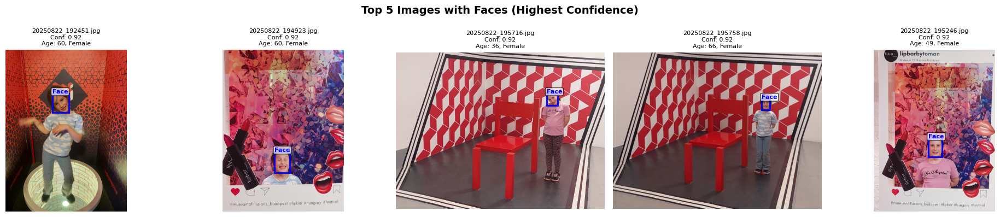

In [14]:
# 5 images WITH faces (highest confidence)
sorted_by_face_conf = sorted(
    [r for r in insightface_results if r['primary']],
    key=lambda x: x['primary']['confidence'],
    reverse=True
)

top5_faces = sorted_by_face_conf[:5]
print("\n=== TOP 5 IMAGES WITH FACES (highest confidence) ===")
for r in top5_faces:
    p = r['primary']
    print(f"  {r['path'].name}: conf={p['confidence']:.3f}, age={p['age']}, gender={p['gender']}")

show_images_grid(
    [{
        'path': r['path'],
        'face_bbox': r['primary']['bbox'],
        'info': f"Conf: {r['primary']['confidence']:.2f}\nAge: {r['primary']['age']}, {r['primary']['gender']}"
    } for r in top5_faces],
    "Top 5 Images with Faces (Highest Confidence)"
)


=== IMAGES WITHOUT FACES (12 total) ===


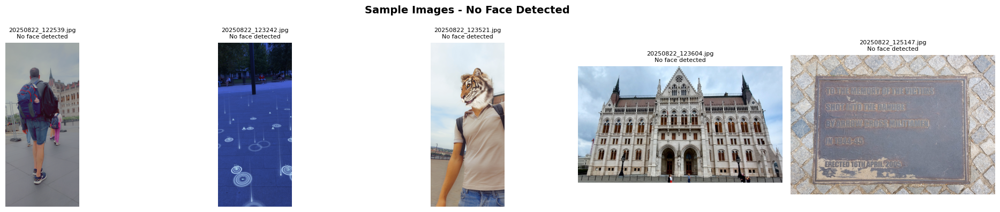

In [15]:
# 5 images WITHOUT faces
sample_no_faces = without_faces[:5] if len(without_faces) >= 5 else without_faces
print(f"\n=== IMAGES WITHOUT FACES ({len(without_faces)} total) ===")

show_images_grid(
    [{'path': r['path'], 'info': 'No face detected'} for r in sample_no_faces],
    "Sample Images - No Face Detected"
)


=== TOP 5 SMILING FACES ===
  20250822_194713.jpg: smile=1.000, age=43, gender=Female
  20250822_195021.jpg: smile=1.000, age=41, gender=Male
  20250822_123318.jpg: smile=0.319, age=31, gender=Male
  20250822_193736.jpg: smile=0.310, age=73, gender=Female
  20250822_193734.jpg: smile=0.281, age=62, gender=Female


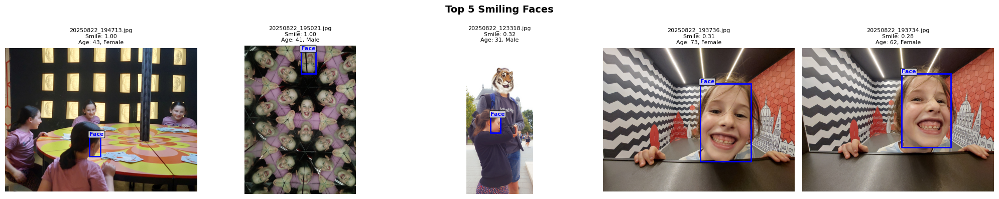

In [16]:
# 5 images with SMILING (highest smile score)
sorted_by_smile = sorted(
    [r for r in insightface_results if r['primary'] and r['primary']['smile_score'] is not None],
    key=lambda x: x['primary']['smile_score'],
    reverse=True
)

top5_smiling = sorted_by_smile[:5]
print("\n=== TOP 5 SMILING FACES ===")
for r in top5_smiling:
    p = r['primary']
    print(f"  {r['path'].name}: smile={p['smile_score']:.3f}, age={p['age']}, gender={p['gender']}")

show_images_grid(
    [{
        'path': r['path'],
        'face_bbox': r['primary']['bbox'],
        'info': f"Smile: {r['primary']['smile_score']:.2f}\nAge: {r['primary']['age']}, {r['primary']['gender']}"
    } for r in top5_smiling],
    "Top 5 Smiling Faces"
)


=== TOP 5 NOT SMILING FACES ===
  20250822_195738.jpg: smile=0.000, age=43, gender=Female
  20250822_195740.jpg: smile=0.000, age=46, gender=Female
  20250824_152144.jpg: smile=0.000, age=33, gender=Female
  20250824_152647.jpg: smile=0.000, age=36, gender=Male
  20250824_170810.jpg: smile=0.000, age=76, gender=Female


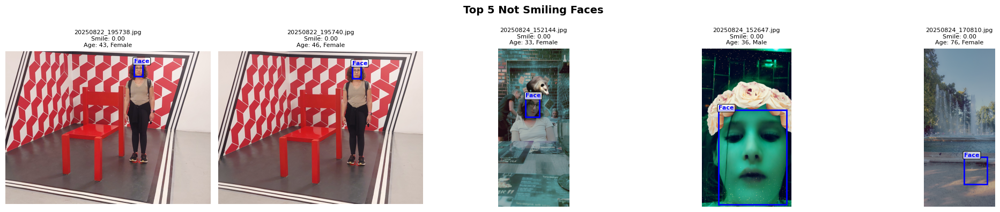

In [17]:
# 5 images NOT SMILING (lowest smile score)
top5_not_smiling = sorted_by_smile[-5:] if len(sorted_by_smile) >= 5 else sorted_by_smile
print("\n=== TOP 5 NOT SMILING FACES ===")
for r in top5_not_smiling:
    p = r['primary']
    print(f"  {r['path'].name}: smile={p['smile_score']:.3f}, age={p['age']}, gender={p['gender']}")

show_images_grid(
    [{
        'path': r['path'],
        'face_bbox': r['primary']['bbox'],
        'info': f"Smile: {r['primary']['smile_score']:.2f}\nAge: {r['primary']['age']}, {r['primary']['gender']}"
    } for r in top5_not_smiling],
    "Top 5 Not Smiling Faces"
)

In [18]:
# Face pose analysis (if available)
faces_with_pose = [r for r in insightface_results if r['primary'] and r['primary']['pose'] is not None]
print(f"\n=== FACE POSE ANALYSIS ({len(faces_with_pose)} faces with pose data) ===")

if faces_with_pose:
    # Front-facing (low yaw)
    front_facing = sorted(faces_with_pose, key=lambda x: abs(x['primary']['pose']['yaw']))[:5]
    print("\nTop 5 Front-Facing (lowest yaw):")
    for r in front_facing:
        p = r['primary']['pose']
        print(f"  {r['path'].name}: yaw={p['yaw']:.1f}, pitch={p['pitch']:.1f}, roll={p['roll']:.1f}")
    
    # Side-facing (high yaw)
    side_facing = sorted(faces_with_pose, key=lambda x: abs(x['primary']['pose']['yaw']), reverse=True)[:5]
    print("\nTop 5 Side-Facing (highest yaw):")
    for r in side_facing:
        p = r['primary']['pose']
        print(f"  {r['path'].name}: yaw={p['yaw']:.1f}, pitch={p['pitch']:.1f}, roll={p['roll']:.1f}")
else:
    print("  No pose data available from InsightFace model.")
    print("  (Pose angles require specific InsightFace models with pose estimation)")


=== FACE POSE ANALYSIS (110 faces with pose data) ===

Top 5 Front-Facing (lowest yaw):
  20250822_194711.jpg: yaw=-0.2, pitch=25.9, roll=-4.9
  20250822_194926.jpg: yaw=0.3, pitch=7.1, roll=-0.1
  20250822_195800.jpg: yaw=-0.6, pitch=-0.4, roll=6.0
  20250824_154601.jpg: yaw=0.7, pitch=-4.7, roll=3.6
  20250822_195124.jpg: yaw=0.7, pitch=2.8, roll=180.0

Top 5 Side-Facing (highest yaw):
  20250822_193357.jpg: yaw=-100.7, pitch=82.7, roll=-84.8
  20250822_123409.jpg: yaw=94.9, pitch=81.1, roll=124.0
  20250822_193353.jpg: yaw=-74.8, pitch=75.7, roll=-66.5
  20250822_123318.jpg: yaw=66.6, pitch=79.4, roll=80.5
  20250822_123534.jpg: yaw=59.5, pitch=82.1, roll=57.6


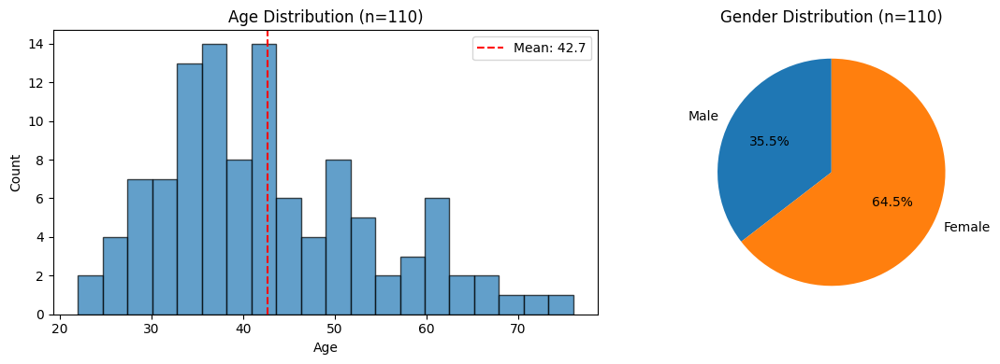

In [19]:
# Age & Gender distribution
ages = [r['primary']['age'] for r in insightface_results if r['primary'] and r['primary']['age']]
genders = [r['primary']['gender'] for r in insightface_results if r['primary'] and r['primary']['gender']]

if ages:
    fig, axes = plt.subplots(1, 2, figsize=(12, 4))
    
    # Age histogram
    axes[0].hist(ages, bins=20, edgecolor='black', alpha=0.7)
    axes[0].set_xlabel('Age')
    axes[0].set_ylabel('Count')
    axes[0].set_title(f'Age Distribution (n={len(ages)})')
    axes[0].axvline(np.mean(ages), color='red', linestyle='--', label=f'Mean: {np.mean(ages):.1f}')
    axes[0].legend()
    
    # Gender pie chart
    gender_counts = {'Male': genders.count('Male'), 'Female': genders.count('Female')}
    axes[1].pie(gender_counts.values(), labels=gender_counts.keys(), autopct='%1.1f%%', startangle=90)
    axes[1].set_title(f'Gender Distribution (n={len(genders)})')
    
    plt.tight_layout()
    plt.show()


=== INSIGHTFACE ANALYSIS: 20250822_112331.jpg ===
Faces detected: True
Number of faces: 4

Face 0:
  Confidence: 0.830
  Bounding box: x=1718, y=737, w=513, h=769
  Age: 22
  Gender: Female
  Smile score: 0.222
  Pose: yaw=-11.4, pitch=9.3, roll=0.2
  Landmarks (5 points):
    left_eye: (1884.5, 1050.4)
    right_eye: (2121.2, 1051.2)
    nose: (2018.2, 1221.1)
    mouth_left: (1877.5, 1304.8)
    mouth_right: (2103.6, 1306.1)

Face 1:
  Confidence: 0.765
  Bounding box: x=2516, y=177, w=243, h=379
  Age: 41
  Gender: Female
  Smile score: N/A
  Pose: yaw=-20.0, pitch=-73.5, roll=2.6
  Landmarks (5 points):
    left_eye: (2551.9, 335.3)
    right_eye: (2585.8, 340.6)
    nose: (2523.1, 414.9)
    mouth_left: (2583.4, 478.0)
    mouth_right: (2603.2, 479.4)

Face 2:
  Confidence: 0.373
  Bounding box: x=388, y=-99, w=169, h=242
  Age: 42
  Gender: Female
  Smile score: N/A
  Pose: yaw=-1.1, pitch=-65.2, roll=-34.6
  Landmarks (5 points):
    left_eye: (424.5, -10.6)
    right_eye: (434

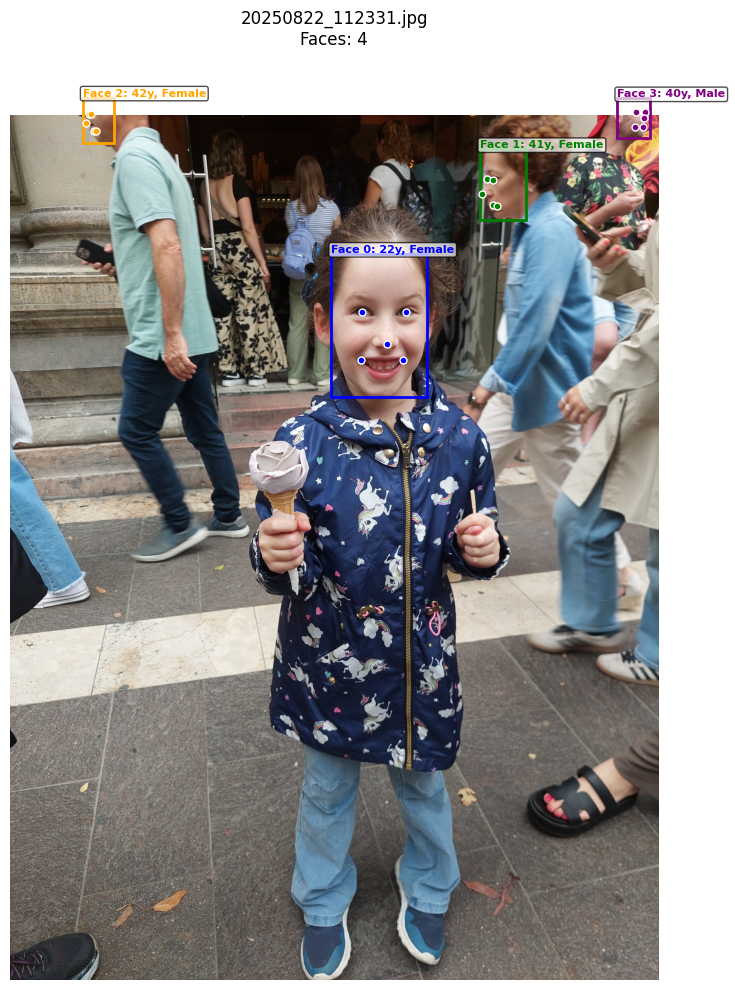

In [20]:
# === RUN ON SPECIFIC IMAGE ===
# Change this path to analyze a specific image

SPECIFIC_IMAGE = all_images[0]  # Change index or set full path
# SPECIFIC_IMAGE = Path(r"D:\Budapest2025_Google\your_image.jpg")

result = detect_faces_insightface(SPECIFIC_IMAGE, insightface_app)

print(f"\n=== INSIGHTFACE ANALYSIS: {SPECIFIC_IMAGE.name} ===")
print(f"Faces detected: {result['faces_detected']}")
print(f"Number of faces: {result['num_faces']}")

for i, face in enumerate(result['faces']):
    print(f"\nFace {i}:")
    print(f"  Confidence: {face['confidence']:.3f}")
    print(f"  Bounding box: x={face['bbox']['x_px']}, y={face['bbox']['y_px']}, "
          f"w={face['bbox']['w_px']}, h={face['bbox']['h_px']}")
    print(f"  Age: {face['age']}")
    print(f"  Gender: {face['gender']}")
    print(f"  Smile score: {face['smile_score']:.3f}" if face['smile_score'] else "  Smile score: N/A")
    if face['pose']:
        print(f"  Pose: yaw={face['pose']['yaw']:.1f}, pitch={face['pose']['pitch']:.1f}, roll={face['pose']['roll']:.1f}")
    if face['landmarks'] is not None:
        print(f"  Landmarks (5 points):")
        landmark_names = ['left_eye', 'right_eye', 'nose', 'mouth_left', 'mouth_right']
        for j, (lm, name) in enumerate(zip(face['landmarks'], landmark_names)):
            print(f"    {name}: ({lm[0]:.1f}, {lm[1]:.1f})")

# Visualize
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
img = load_image(SPECIFIC_IMAGE)
ax.imshow(img)

colors = ['blue', 'green', 'orange', 'purple', 'cyan']
for i, face in enumerate(result['faces']):
    color = colors[i % len(colors)]
    draw_bbox(ax, face['bbox'], color=color, linewidth=2, 
              label=f"Face {i}: {face['age']}y, {face['gender']}")
    
    # Draw landmarks
    if face['landmarks'] is not None:
        for lm in face['landmarks']:
            ax.plot(lm[0], lm[1], 'o', markersize=5, color=color, markeredgecolor='white')

ax.set_title(f"{SPECIFIC_IMAGE.name}\nFaces: {result['num_faces']}", fontsize=12)
ax.axis('off')
plt.tight_layout()
plt.show()

---
# Part 3: Combined Analysis (YOLOv8 + InsightFace)

Combining person detection with face analysis:
- Images with person but NO face (back turned, occluded)
- Images with person AND face
- Smiling vs not smiling among detected persons

In [21]:
# Combine results
combined_results = []

for yolo_r, insight_r in zip(yolo_results, insightface_results):
    combined_results.append({
        'path': yolo_r['path'],
        'person_detected': yolo_r['person_detected'],
        'face_detected': insight_r['faces_detected'],
        'num_persons': yolo_r['num_persons'],
        'num_faces': insight_r['num_faces'],
        'person': yolo_r['primary'],
        'face': insight_r['primary'],
        'all_faces': insight_r['faces'],
    })

# Categories
person_with_face = [r for r in combined_results if r['person_detected'] and r['face_detected']]
person_no_face = [r for r in combined_results if r['person_detected'] and not r['face_detected']]
face_no_person = [r for r in combined_results if not r['person_detected'] and r['face_detected']]
neither = [r for r in combined_results if not r['person_detected'] and not r['face_detected']]

print("=== COMBINED DETECTION SUMMARY ===")
print(f"Person + Face: {len(person_with_face)}")
print(f"Person only (no face): {len(person_no_face)}")
print(f"Face only (no person): {len(face_no_person)}")
print(f"Neither: {len(neither)}")

=== COMBINED DETECTION SUMMARY ===
Person + Face: 109
Person only (no face): 5
Face only (no person): 1
Neither: 7



=== IMAGES WITH PERSON + FACE ===


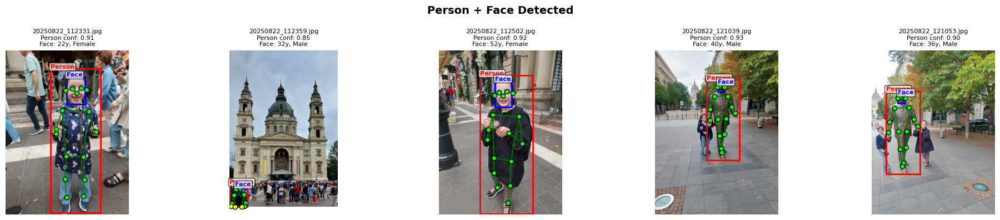

In [22]:
# 5 images with PERSON + FACE
print("\n=== IMAGES WITH PERSON + FACE ===")
sample_person_face = person_with_face[:5]

show_images_grid(
    [{
        'path': r['path'],
        'person_bbox': r['person']['bbox'],
        'face_bbox': r['face']['bbox'],
        'keypoints': r['person']['keypoints'],
        'info': f"Person conf: {r['person']['confidence']:.2f}\nFace: {r['face']['age']}y, {r['face']['gender']}"
    } for r in sample_person_face],
    "Person + Face Detected"
)


=== IMAGES WITH PERSON BUT NO FACE (5 total) ===


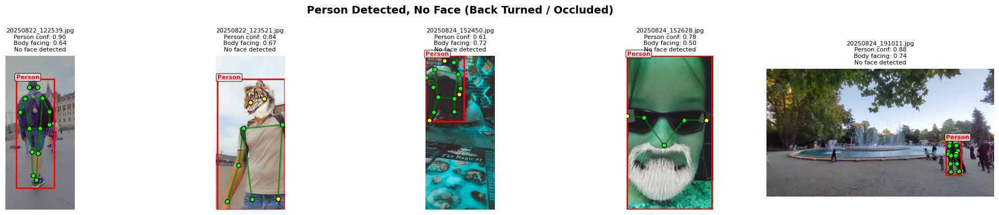

In [23]:
# 5 images with PERSON but NO FACE (back turned, occluded, etc.)
print(f"\n=== IMAGES WITH PERSON BUT NO FACE ({len(person_no_face)} total) ===")
sample_person_no_face = person_no_face[:5] if len(person_no_face) >= 5 else person_no_face

if sample_person_no_face:
    show_images_grid(
        [{
            'path': r['path'],
            'person_bbox': r['person']['bbox'],
            'keypoints': r['person']['keypoints'],
            'info': f"Person conf: {r['person']['confidence']:.2f}\nBody facing: {r['person']['body_facing_score']:.2f}\nNo face detected"
        } for r in sample_person_no_face],
        "Person Detected, No Face (Back Turned / Occluded)"
    )
else:
    print("  No images in this category.")


=== PERSONS WITH FACES - TOP 5 SMILING ===
  20250822_194713.jpg: smile=1.000, body_facing=0.50
  20250822_195021.jpg: smile=1.000, body_facing=0.50
  20250822_123318.jpg: smile=0.319, body_facing=0.65
  20250822_193736.jpg: smile=0.310, body_facing=0.50
  20250822_193734.jpg: smile=0.281, body_facing=0.50


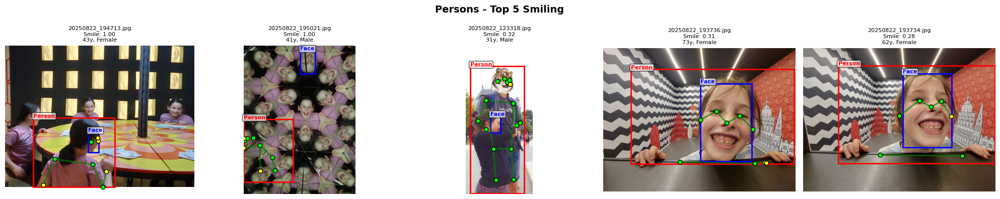

In [24]:
# Among persons with faces: 5 SMILING, 5 NOT SMILING
persons_with_smile = [
    r for r in person_with_face 
    if r['face'] and r['face']['smile_score'] is not None
]

sorted_by_smile = sorted(persons_with_smile, key=lambda x: x['face']['smile_score'], reverse=True)

# Top 5 smiling
top5_smiling = sorted_by_smile[:5]
print("\n=== PERSONS WITH FACES - TOP 5 SMILING ===")
for r in top5_smiling:
    print(f"  {r['path'].name}: smile={r['face']['smile_score']:.3f}, "
          f"body_facing={r['person']['body_facing_score']:.2f}")

show_images_grid(
    [{
        'path': r['path'],
        'person_bbox': r['person']['bbox'],
        'face_bbox': r['face']['bbox'],
        'keypoints': r['person']['keypoints'],
        'info': f"Smile: {r['face']['smile_score']:.2f}\n{r['face']['age']}y, {r['face']['gender']}"
    } for r in top5_smiling],
    "Persons - Top 5 Smiling"
)

In [30]:
top5_smiling[-1]

{'path': WindowsPath('D:/Budapest2025_Google/20250822_193734.jpg'),
 'person_detected': True,
 'face_detected': True,
 'num_persons': 2,
 'num_faces': 1,
 'person': {'bbox': {'x': 0.18344879150390625,
   'y': 0.12158464558919271,
   'w': 0.8156314086914063,
   'h': 0.6832864583333333,
   'x_px': 733,
   'y_px': 364,
   'w_px': 3262,
   'h_px': 2049},
  'confidence': 0.2990439534187317,
  'keypoints': array([[    0.66687,     0.40947,     0.98872],
         [    0.71803,     0.36926,     0.96346],
         [    0.60431,     0.36526,     0.99375],
         [    0.77045,     0.47357,     0.35848],
         [    0.50182,     0.47073,     0.91936],
         [    0.82843,     0.74932,     0.73776],
         [     0.4008,     0.74505,      0.8252],
         [     0.8801,     0.76878,    0.049435],
         [    0.30755,      0.7754,     0.14713],
         [    0.84089,     0.70331,     0.11311],
         [    0.26956,     0.71639,     0.24414],
         [    0.69157,     0.96694,    0.017037]


=== PERSONS WITH FACES - TOP 5 NOT SMILING ===
  20250822_195716.jpg: smile=0.000, body_facing=0.65
  20250822_195738.jpg: smile=0.000, body_facing=0.63
  20250822_195740.jpg: smile=0.000, body_facing=0.64
  20250824_152144.jpg: smile=0.000, body_facing=0.50
  20250824_152647.jpg: smile=0.000, body_facing=0.50


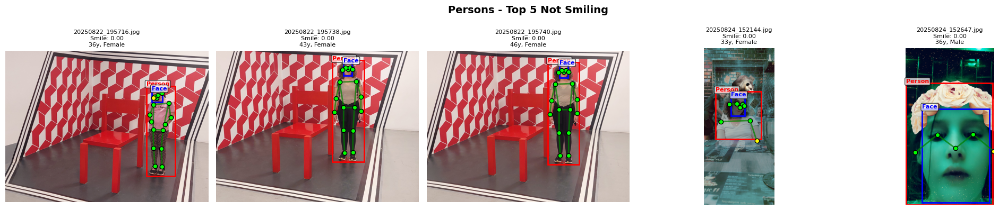

In [25]:
# Top 5 NOT smiling
top5_not_smiling = sorted_by_smile[-5:] if len(sorted_by_smile) >= 5 else sorted_by_smile
print("\n=== PERSONS WITH FACES - TOP 5 NOT SMILING ===")
for r in top5_not_smiling:
    print(f"  {r['path'].name}: smile={r['face']['smile_score']:.3f}, "
          f"body_facing={r['person']['body_facing_score']:.2f}")

show_images_grid(
    [{
        'path': r['path'],
        'person_bbox': r['person']['bbox'],
        'face_bbox': r['face']['bbox'],
        'keypoints': r['person']['keypoints'],
        'info': f"Smile: {r['face']['smile_score']:.2f}\n{r['face']['age']}y, {r['face']['gender']}"
    } for r in top5_not_smiling],
    "Persons - Top 5 Not Smiling"
)

In [28]:
top5_not_smiling

[{'path': WindowsPath('D:/Budapest2025_Google/20250822_195716.jpg'),
  'person_detected': True,
  'face_detected': True,
  'num_persons': 1,
  'num_faces': 1,
  'person': {'bbox': {'x': 0.6953438623553742,
    'y': 0.23234190275374855,
    'w': 0.1415665042441609,
    'h': 0.5958851744971886,
    'x_px': 3215,
    'y_px': 805,
    'w_px': 654,
    'h_px': 2066},
   'confidence': 0.9085339903831482,
   'keypoints': array([[    0.74702,     0.30969,     0.98899],
          [    0.75134,     0.29151,     0.98861],
          [    0.73463,      0.3029,     0.92239],
          [    0.77345,     0.27996,     0.95314],
          [    0.72935,     0.30982,     0.42752],
          [    0.80582,     0.34623,      0.9966],
          [    0.73132,     0.35432,     0.98814],
          [    0.81577,     0.43946,     0.97342],
          [    0.71173,     0.42354,     0.86298],
          [    0.78775,     0.48596,     0.94348],
          [    0.71906,     0.46655,      0.7973],
          [    0.77732, 


=== COMBINED ANALYSIS: 20250822_112331.jpg ===

Person Detection (YOLOv8):
  Detected: True
  Confidence: 0.913
  Body facing: 0.639
  Keypoint confidence: 0.971

Face Detection (InsightFace):
  Detected: True
  Number of faces: 4
  Primary face:
    Confidence: 0.830
    Age: 22
    Gender: Female
    Smile score: 0.222


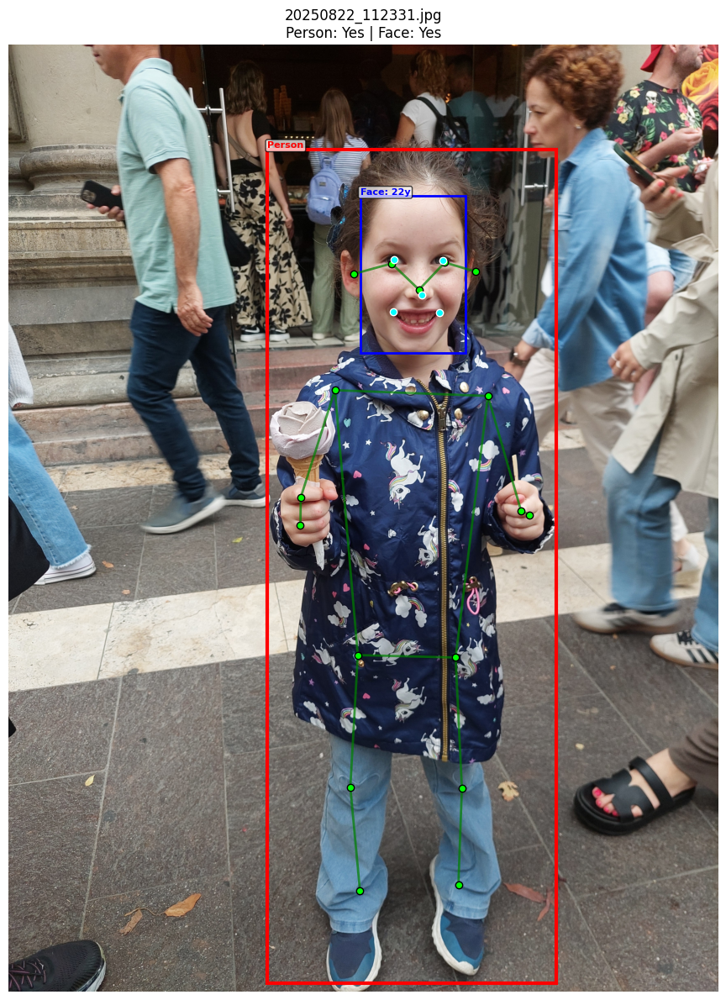

In [26]:
# === COMBINED ANALYSIS ON SPECIFIC IMAGE ===
# Change this path to analyze a specific image

SPECIFIC_IMAGE = all_images[0]  # Change index or set full path
# SPECIFIC_IMAGE = Path(r"D:\Budapest2025_Google\your_image.jpg")

# Find in combined results
combined_r = next((r for r in combined_results if r['path'] == SPECIFIC_IMAGE), None)

if combined_r:
    print(f"\n=== COMBINED ANALYSIS: {SPECIFIC_IMAGE.name} ===")
    print(f"\nPerson Detection (YOLOv8):")
    print(f"  Detected: {combined_r['person_detected']}")
    if combined_r['person']:
        p = combined_r['person']
        print(f"  Confidence: {p['confidence']:.3f}")
        print(f"  Body facing: {p['body_facing_score']:.3f}")
        print(f"  Keypoint confidence: {p['keypoint_confidence']:.3f}")
    
    print(f"\nFace Detection (InsightFace):")
    print(f"  Detected: {combined_r['face_detected']}")
    print(f"  Number of faces: {combined_r['num_faces']}")
    if combined_r['face']:
        f = combined_r['face']
        print(f"  Primary face:")
        print(f"    Confidence: {f['confidence']:.3f}")
        print(f"    Age: {f['age']}")
        print(f"    Gender: {f['gender']}")
        print(f"    Smile score: {f['smile_score']:.3f}" if f['smile_score'] else "    Smile score: N/A")

# Visualize
fig, ax = plt.subplots(1, 1, figsize=(12, 12))
img = load_image(SPECIFIC_IMAGE)
ax.imshow(img)

if combined_r and combined_r['person']:
    draw_bbox(ax, combined_r['person']['bbox'], color='red', linewidth=3, label='Person')
    draw_keypoints(ax, combined_r['person']['keypoints'], img.width, img.height)

if combined_r and combined_r['face']:
    draw_bbox(ax, combined_r['face']['bbox'], color='blue', linewidth=2, 
              label=f"Face: {combined_r['face']['age']}y")
    # Draw landmarks
    if combined_r['face']['landmarks'] is not None:
        for lm in combined_r['face']['landmarks']:
            ax.plot(lm[0], lm[1], 'o', markersize=6, color='cyan', markeredgecolor='white')

title = f"{SPECIFIC_IMAGE.name}\n"
title += f"Person: {'Yes' if combined_r['person_detected'] else 'No'} | "
title += f"Face: {'Yes' if combined_r['face_detected'] else 'No'}"
ax.set_title(title, fontsize=12)
ax.axis('off')
plt.tight_layout()
plt.show()

In [27]:
# Summary statistics
print("\n" + "="*60)
print("FINAL SUMMARY")
print("="*60)
print(f"\nDataset: {DATASET_PATH}")
print(f"Total images: {len(all_images)}")
print(f"\nYOLOv8 Person Detection:")
print(f"  Images with person: {len(with_person)} ({100*len(with_person)/len(all_images):.1f}%)")
print(f"  Images without person: {len(without_person)} ({100*len(without_person)/len(all_images):.1f}%)")
print(f"\nInsightFace Face Detection:")
print(f"  Images with face: {len(with_faces)} ({100*len(with_faces)/len(all_images):.1f}%)")
print(f"  Images without face: {len(without_faces)} ({100*len(without_faces)/len(all_images):.1f}%)")
print(f"\nCombined:")
print(f"  Person + Face: {len(person_with_face)} ({100*len(person_with_face)/len(all_images):.1f}%)")
print(f"  Person only: {len(person_no_face)} ({100*len(person_no_face)/len(all_images):.1f}%)")
print(f"  Face only: {len(face_no_person)} ({100*len(face_no_person)/len(all_images):.1f}%)")
print(f"  Neither: {len(neither)} ({100*len(neither)/len(all_images):.1f}%)")


FINAL SUMMARY

Dataset: D:\Budapest2025_Google
Total images: 122

YOLOv8 Person Detection:
  Images with person: 114 (93.4%)
  Images without person: 8 (6.6%)

InsightFace Face Detection:
  Images with face: 110 (90.2%)
  Images without face: 12 (9.8%)

Combined:
  Person + Face: 109 (89.3%)
  Person only: 5 (4.1%)
  Face only: 1 (0.8%)
  Neither: 7 (5.7%)


---
## Quick Reference: Model Outputs

### YOLOv8-Pose
| Output | Type | Description |
|--------|------|-------------|
| `bbox` | dict | Bounding box (x, y, w, h in pixels and normalized) |
| `confidence` | float | Detection confidence (0-1) |
| `keypoints` | array (17,3) | COCO keypoints (x, y, confidence) |
| `body_facing_score` | float | Shoulder-hip symmetry (1=front, 0=side) |
| `keypoint_confidence` | float | Average keypoint confidence |

### InsightFace
| Output | Type | Description |
|--------|------|-------------|
| `bbox` | dict | Face bounding box |
| `confidence` | float | Detection confidence (det_score) |
| `landmarks` | array (5,2) | 5-point landmarks (eyes, nose, mouth) |
| `age` | int | Estimated age |
| `gender` | str | 'Male' or 'Female' |
| `pose` | dict | yaw, pitch, roll angles (if available) |
| `smile_score` | float | Heuristic smile score from landmarks |
| `embedding` | array | 512-d face embedding (for recognition) |